<a href="https://colab.research.google.com/github/diloo11/244107020229-mobile-course/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 30


/tmp/ipykernel_2366/896963226.py:21: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


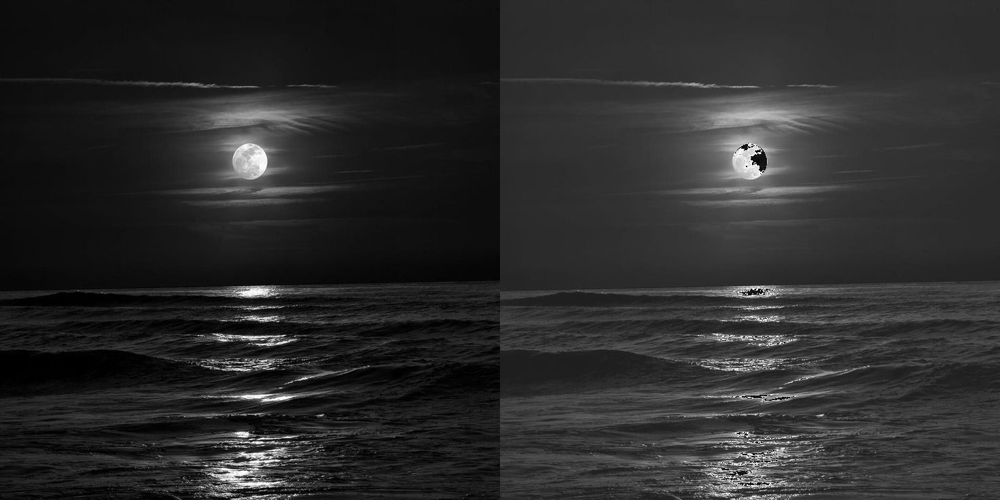

In [6]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, not a number')

#sesuaikan dengan file dan folder di drive Anda
original = cv.imread('/content/drive/MyDrive/sea.jpeg')
brightness_image = np.zeros(original.shape, original.dtype)

#akses per piksel
#np.clip digunakan untuk melakukan truncate pixel (nilai dibatasi antara 0-255)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

TUGAS PRAKTIKUM

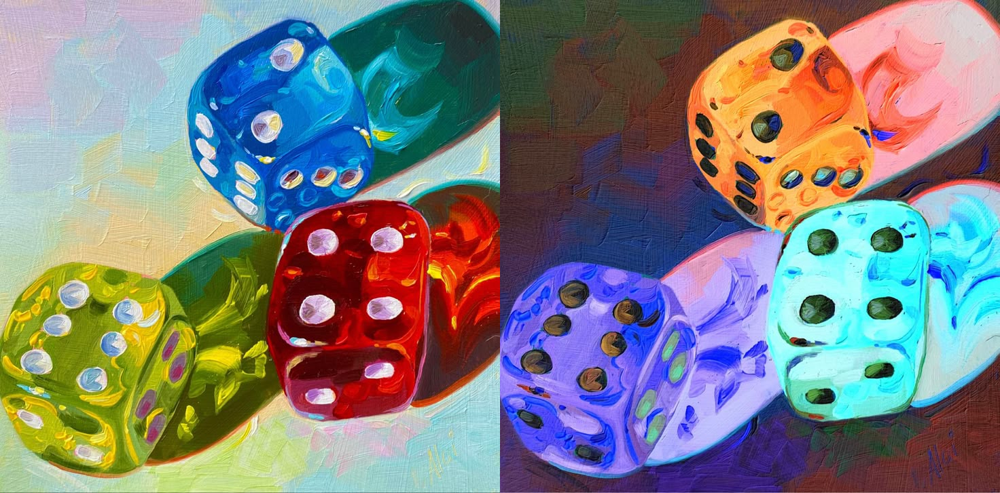

In [7]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

# 1. Baca gambar asli
img = cv.imread('/content/drive/MyDrive/Dice.jpeg')

# 2. Implementasi Formula Inverse Citra: s = 255 - r
# Menggunakan array/operasi langsung NumPy
inversed_img = 255 - img

# 3. Gabungkan gambar asli dan gambar inverse secara horizontal
final_frame = cv.hconcat((img, inversed_img))

# 4. Tampilkan hasil di Google Colab
cv2_imshow(final_frame)

Mengubah kontras dan tingkat kecerahan citra
-------------------------------------------
Masukkan tingkat kecerahan : 10
Masukkan kontras : 1.5


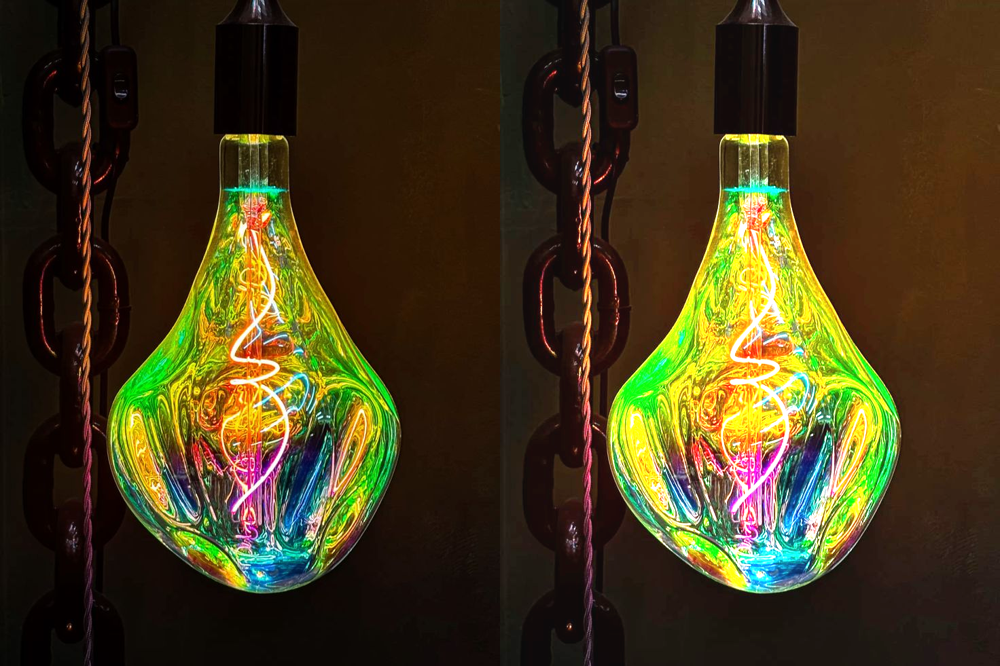

In [10]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Mengubah kontras dan tingkat kecerahan citra')
print('-------------------------------------------')

try:
    brightness = int(input('Masukkan tingkat kecerahan : '))
    contrast = float(input('Masukkan kontras : '))
except ValueError:
    print('Error, masukkan angka yang valid')

# 1. Baca citra asli
img = cv.imread('/content/drive/MyDrive/Lamp.jpeg')

# 2. Persiapkan array kosong dengan ukuran dan tipe data yang sama
contrast_image = np.zeros(img.shape, img.dtype)

# 3. Transformasi kontras & kecerahan per piksel
# Formula dasar: g(x,y) = α * f(x,y) + β
# α (alpha) = kontras, β (beta) = brightness
for y in range(img.shape[0]):
    for x in range(img.shape[1]):
        for c in range(img.shape[2]):
            contrast_image[y, x, c] = np.clip(contrast * img[y, x, c] + brightness, 0, 255)

# 4. Gabungkan citra asli dan hasil transformasi secara horizontal
final_frame = cv.hconcat((img, contrast_image))

# 5. Tampilkan hasil
cv2_imshow(final_frame)

Mengubah tingkat kecerahan citra dengan Transformasi Log
------------------------------------------------------
Masukkan nilai kecerahan: 50


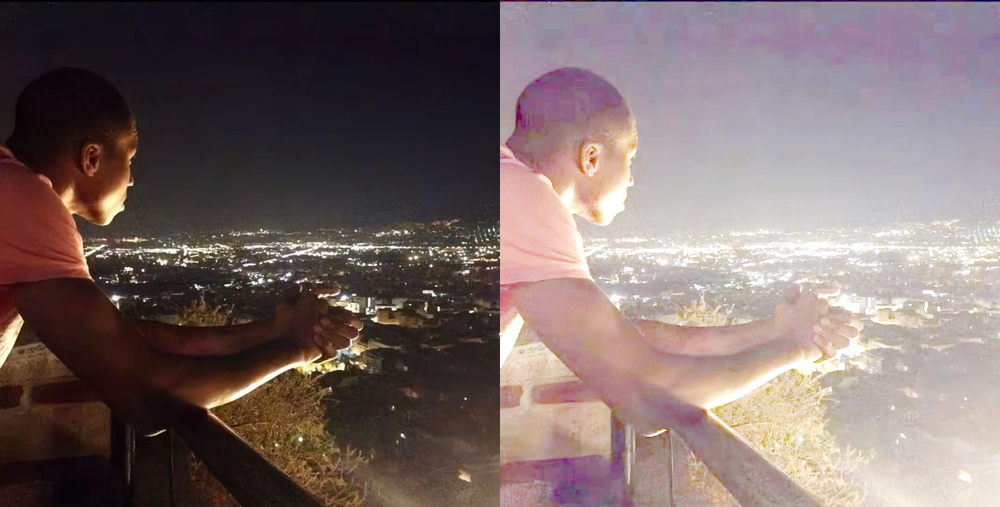

In [11]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
print('------------------------------------------------------')

try:
    c = float(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, masukkan angka yang valid')

# 1. Baca citra asli
img = cv.imread('/content/drive/MyDrive/giannis.jpeg')

# 2. Implementasi Transformasi Logaritma
# Formula dasar: s = c * log(1 + r)
# Konversi ke float untuk menghindari overflow saat perhitungan logaritma
img_float = img.astype(np.float32)

# Hitung nilai logaritma pada tiap piksel
log_image = c * np.log1p(img_float) # np.log1p(x) sama dengan np.log(1 + x)

# 3. Truncate/Saturasi nilai piksel agar berada di rentang 0-255 dan ubah tipe data ke uint8
log_image = np.clip(log_image, 0, 255).astype(np.uint8)

# 4. Gabungkan citra asli dan hasil transformasi secara horizontal
final_frame = cv.hconcat((img, log_image))

# 5. Tampilkan hasil
cv2_imshow(final_frame)

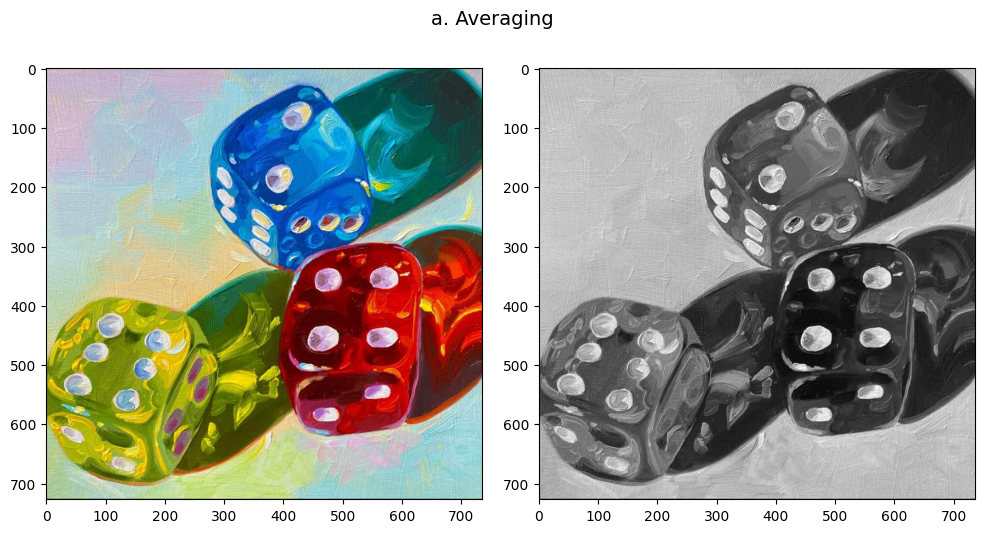

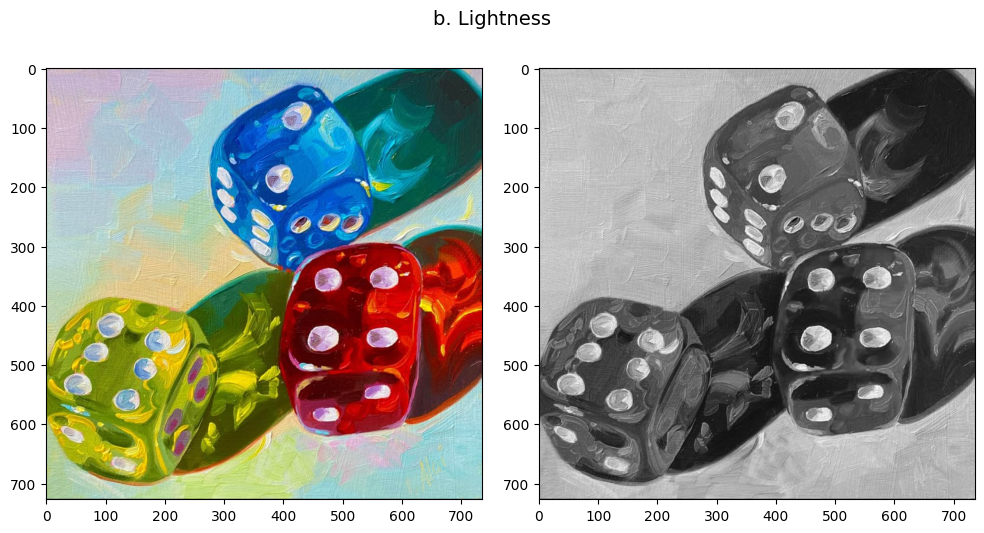

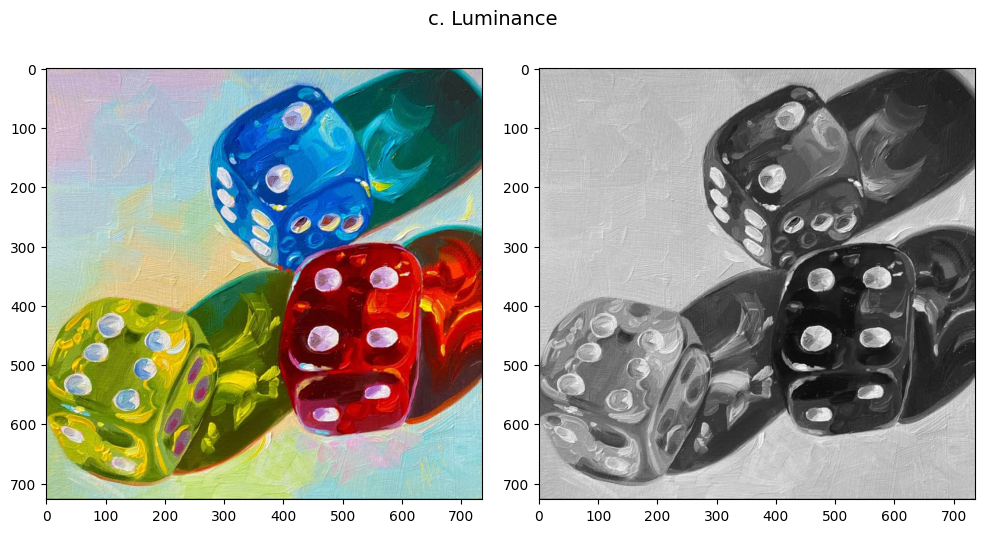

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar (OpenCV membaca dalam format BGR)
img_bgr = cv.imread('/content/drive/MyDrive/Dice.jpeg')

# Konversi BGR ke RGB untuk tampilan matplotlib yang benar
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# Pisahkan channel warna R, G, B (float untuk perhitungan presisi)
R = img_rgb[:, :, 0].astype(np.float32)
G = img_rgb[:, :, 1].astype(np.float32)
B = img_rgb[:, :, 2].astype(np.float32)

# 2. Perhitungan Metode Grayscale
# a. Averaging: (R + G + B) / 3
gray_avg = ((R + G + B) / 3.0).astype(np.uint8)

# b. Lightness: (max(R,G,B) + min(R,G,B)) / 2
max_rgb = np.maximum(np.maximum(R, G), B)
min_rgb = np.minimum(np.minimum(R, G), B)
gray_lightness = ((max_rgb + min_rgb) / 2.0).astype(np.uint8)

# c. Luminance: 0.299*R + 0.587*G + 0.114*B
gray_luminance = (0.299 * R + 0.587 * G + 0.114 * B).astype(np.uint8)

# 3. Fungsi untuk menampilkan perbandingan side-by-side
def plot_grayscale(original, gray_img, title_text):
    plt.figure(figsize=(10, 5))

    # Subplot 1: Gambar Asli (RGB)
    plt.subplot(1, 2, 1)
    plt.imshow(original)

    # Subplot 2: Gambar Grayscale
    plt.subplot(1, 2, 2)
    plt.imshow(gray_img, cmap='gray')

    plt.suptitle(title_text, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

# --- TAMPILKAN KELUARAN ---
# a. Averaging
plot_grayscale(img_rgb, gray_avg, 'a. Averaging')

# b. Lightness
plot_grayscale(img_rgb, gray_lightness, 'b. Lightness')

# c. Luminance
plot_grayscale(img_rgb, gray_luminance, 'c. Luminance')

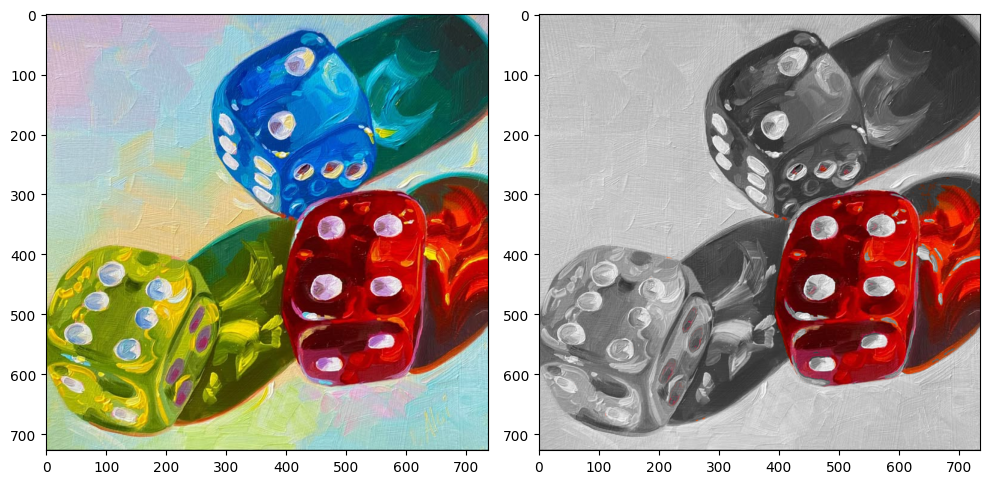

In [13]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca gambar asli
img_bgr = cv.imread('/content/drive/MyDrive/Dice.jpeg')

# Konversi BGR ke RGB (untuk matplotlib) dan HSV (untuk deteksi warna)
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
img_hsv = cv.cvtColor(img_bgr, cv.COLOR_BGR2HSV)

# 2. Tentukan rentang warna merah dalam ruang warna HSV
# Rentang merah 1 (merah gelap / rentang bawah)
lower_red1 = np.array([0, 50, 50])
upper_red1 = np.array([10, 255, 255])

# Rentang merah 2 (merah terang / rentang atas)
lower_red2 = np.array([170, 50, 50])
upper_red2 = np.array([180, 255, 255])

# Buat mask untuk mendeteksi area berwarna merah
mask1 = cv.inRange(img_hsv, lower_red1, upper_red1)
mask2 = cv.inRange(img_hsv, lower_red2, upper_red2)
red_mask = mask1 | mask2

# 3. Buat versi grayscale dari gambar asli (3 channel RGB)
gray_single = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)
gray_rgb = cv.cvtColor(gray_single, cv.COLOR_GRAY2RGB)

# 4. Gabungkan warna merah dari gambar asli dengan latar belakang grayscale
# Jika mask > 0 (area merah), pakai gambar asli. Jika tidak, pakai gambar grayscale.
result_rgb = np.where(red_mask[:, :, np.newaxis] > 0, img_rgb, gray_rgb)

# 5. Tampilkan hasil menggunakan matplotlib
plt.figure(figsize=(10, 5))

# Gambar Asli
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)

# Gambar Hasil Isolasi Warna
plt.subplot(1, 2, 2)
plt.imshow(result_rgb)

plt.tight_layout()
plt.show()

 Gamma Correction pada citra 
-------------------------------
Masukkan nilai Gamma: 0.5


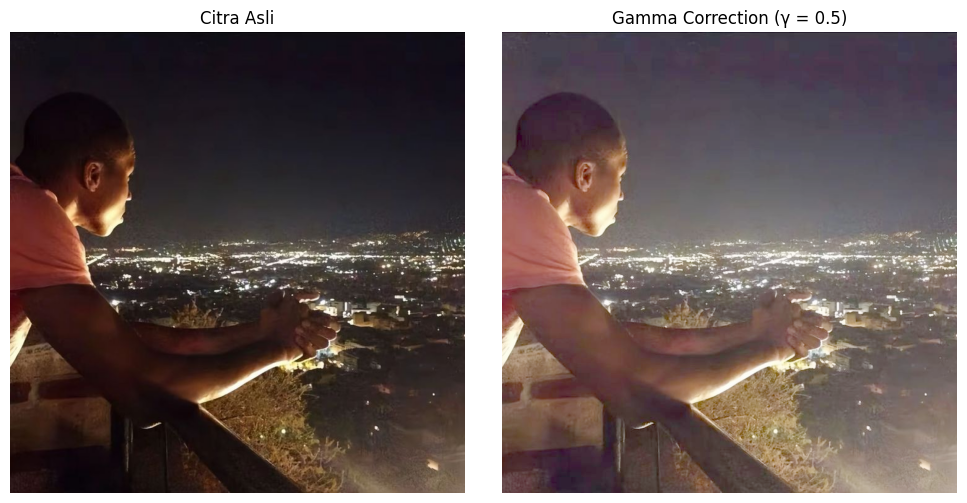

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

print(' Gamma Correction pada citra ')
print('-------------------------------')
try:
    # Menggunakan float agar pengguna bisa memasukkan nilai desimal seperti 0.5
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')

# 1. Baca citra asli
img_bgr = cv.imread('/content/drive/MyDrive/giannis.jpeg')

# Konversi dari BGR ke RGB untuk tampilan Matplotlib
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# 2. Implementasi Formula Gamma Correction: s = c * (r ^ gamma)
# Normalisasi nilai piksel (0-255) ke skala 0-1
img_normalized = img_rgb / 255.0

# Aplikasikan koreksi gamma
gamma_corrected = np.power(img_normalized, gamma)

# Kembalikan ke skala piksel 0-255
gamma_corrected = np.clip(gamma_corrected * 255.0, 0, 255).astype(np.uint8)

# 3. Tampilkan hasil menggunakan Matplotlib
plt.figure(figsize=(10, 5))

# Citra Asli
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Citra Asli')
plt.axis('off')

# Hasil Gamma Correction
plt.subplot(1, 2, 2)
plt.imshow(gamma_corrected)
plt.title(f'Gamma Correction (γ = {gamma})')
plt.axis('off')

plt.tight_layout()
plt.show()

Masukkan bit depth tujuan (1-8): 1
Bit depth awal  : 8 bit
Bit depth tujuan: 1 bit
Jumlah level    : 2


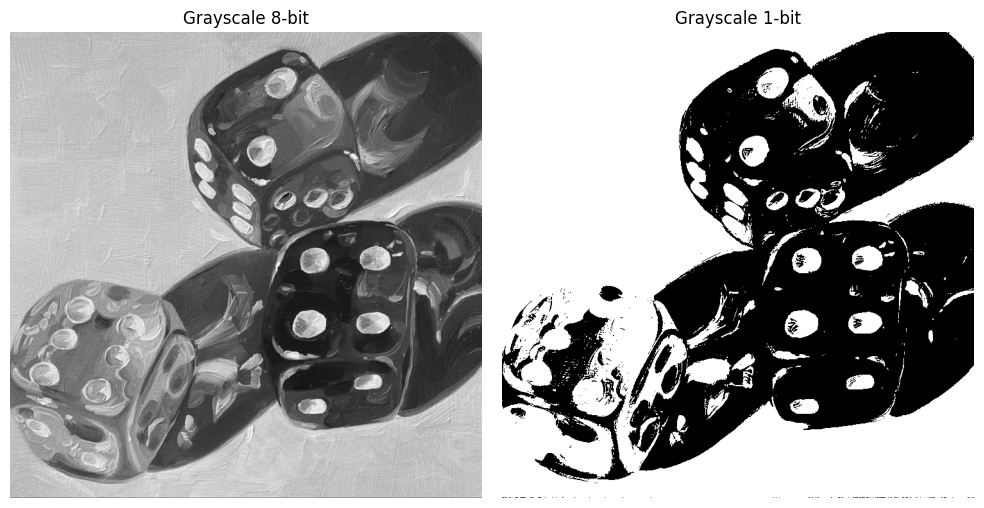

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Input kedalaman bit dari pengguna
try:
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))
    if bit_depth < 1 or bit_depth > 8:
        print('Masukkan angka antara 1 sampai 8!')
        bit_depth = 3 # default ke 3 bit jika input di luar rentang
except ValueError:
    print('Error, not a number')
    bit_depth = 3

# 2. Hitung jumlah level dan rentang pembagian warna
levels = pow(2, bit_depth)
level_step = 255 / (levels - 1)

print(f'Bit depth awal  : 8 bit')
print(f'Bit depth tujuan: {bit_depth} bit')
print(f'Jumlah level    : {levels}')

# 3. Baca citra masukan secara grayscale
original = cv.imread('/content/drive/MyDrive/Dice.jpeg', cv.IMREAD_GRAYSCALE)

# Jika path tidak ditemukan di drive, gunakan nama file langsung
if original is None:
    original = cv.imread('peppers.jpg', cv.IMREAD_GRAYSCALE)

# 4. Kuantisasi citra (Simulasi reduksi bit depth)
# Menghitung nilai piksel baru berdasarkan jumlah level warna yang diinginkan
depth_image = np.round(original / (255 / (levels - 1))) * level_step
depth_image = depth_image.astype(np.uint8)

# 5. Tampilkan hasil menggunakan Matplotlib agar sesuai contoh gambar
plt.figure(figsize=(10, 5))

# Gambar Grayscale 8-bit (Original)
plt.subplot(1, 2, 1)
plt.imshow(original, cmap='gray', vmin=0, vmax=255)
plt.title('Grayscale 8-bit')
plt.axis('off')

# Gambar Grayscale n-bit (Hasil Kuantisasi)
plt.subplot(1, 2, 2)
plt.imshow(depth_image, cmap='gray', vmin=0, vmax=255)
plt.title(f'Grayscale {bit_depth}-bit')
plt.axis('off')

plt.tight_layout()
plt.show()

=== HASIL EVALUASI AVERAGE DENOISING ===
Jumlah Citra:  10 | Nilai PSNR: 19.74 dB
Jumlah Citra:  20 | Nilai PSNR: 19.84 dB
Jumlah Citra:  40 | Nilai PSNR: 19.89 dB
Jumlah Citra:  80 | Nilai PSNR: 19.92 dB
Jumlah Citra: 100 | Nilai PSNR: 19.92 dB


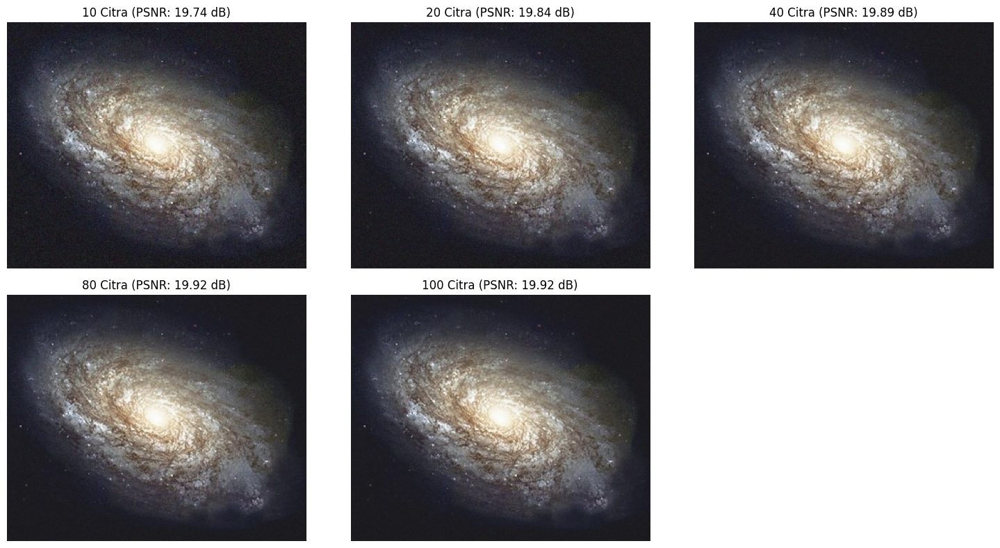

In [26]:
import cv2 as cv
import numpy as np
import glob
import matplotlib.pyplot as plt

# 1. Baca Citra Asli (Ground Truth) untuk acuan PSNR
original_img = cv.imread('/content/drive/MyDrive/galaxy.jpg')

if original_img is None:
    raise FileNotFoundError("Gambar galaxy.jpeg tidak ditemukan! Periksa kembali path Drive Anda.")

# Simpan ukuran resolusi gambar asli (height, width)
target_height, target_width = original_img.shape[:2]

# 2. Baca Semua Citra Ber-noise menggunakan Glob
cv_img = []
folder_path = '/content/drive/MyDrive/noises/*.jpg'

for img_path in sorted(glob.glob(folder_path)):
    n = cv.imread(img_path)
    if n is not None:
        # PERBAIKAN: Resize gambar noise jika ukurannya tidak sama dengan original_img
        if (n.shape[0], n.shape[1]) != (target_height, target_width):
            n = cv.resize(n, (target_width, target_height))
        cv_img.append(n)

# 3. Fungsi untuk melakukan Average Denoising & Menghitung PSNR
def average_denoising(images_list, count, reference_img):
    # Ambil sebanyak 'count' citra
    selected_images = images_list[:count]

    # Gunakan np.mean langsung agar pemrosesan lebih presisi dan stabil
    stack_images = np.array(selected_images, dtype=np.float64)
    avg_array = np.mean(stack_images, axis=0)

    # Batasi nilai piksel pada rentang 0-255 dan kembalikan ke uint8
    avg_img = np.clip(avg_array, 0, 255).astype(np.uint8)

    # Hitung nilai PSNR antara citra asli dan citra hasil averaging
    psnr_value = cv.PSNR(reference_img, avg_img)

    return avg_img, psnr_value

# 4. Eksperimen dengan variasi jumlah citra: [10, 20, 40, 80, 100]
counts = [10, 20, 40, 80, 100]
results = []

print("=== HASIL EVALUASI AVERAGE DENOISING ===")
for N in counts:
    denoised_img, psnr = average_denoising(cv_img, N, original_img)
    results.append((N, denoised_img, psnr))
    print(f"Jumlah Citra: {N:3d} | Nilai PSNR: {psnr:.2f} dB")

# 5. Visualisasi Citra Hasil Denoising
plt.figure(figsize=(15, 8))
for i, (N, img, psnr) in enumerate(results, 1):
    plt.subplot(2, 3, i)
    # Konversi BGR ke RGB untuk tampilan Matplotlib
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title(f"{N} Citra (PSNR: {psnr:.2f} dB)")
    plt.axis('off')

plt.tight_layout()
plt.show()

Does increasing the number of images always result in a significant increase in PSNR?

* Not always. At the initial stage of adding images (for example, from 10 to 20 images), the increase in PSNR value is very sharp/significant. However, as more images are added, the rate of PSNR improvement slows down (diminishing returns).

At what number of images does the improvement start to become less significant?

* The improvement starts to slow down / become less significant after exceeding 40 to 80 images. The visual difference and the decibel (dB) gain between 80 and 100 images are usually very subtle.

Conclusion:

* The Average Denoising method is highly effective in reducing Gaussian Noise because noise is random with a mean value close to zero.

* The more images averaged together, the cleaner the output image becomes and the closer it gets to the original image (resulting in higher PSNR values).

* There is a computational limit to efficiency: adding images beyond a certain threshold (around >40/80 images) requires greater memory and processing power, yet yields negligible improvements in image quality.

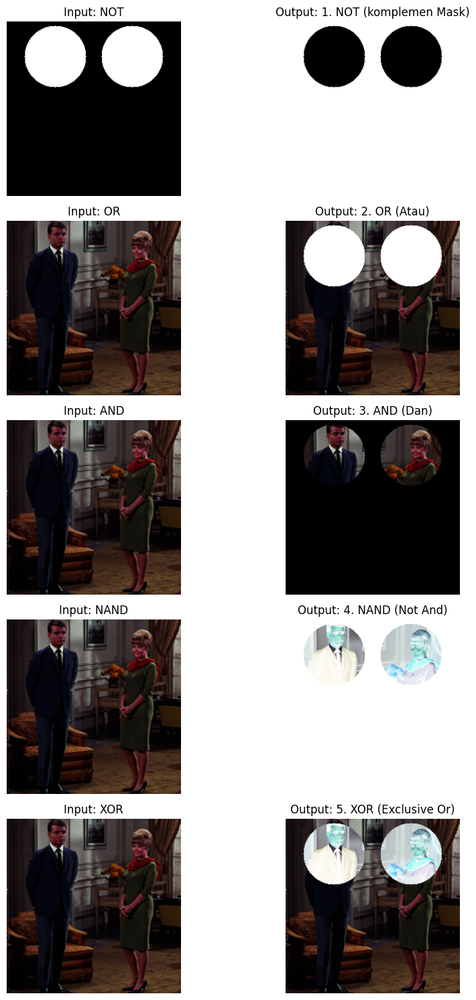

In [29]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca Citra Asli
img = cv.imread('/content/drive/MyDrive/couple.tiff') # Sesuaikan path file

if img is None:
    # Gambar dummy jika file tidak ditemukan
    img = np.zeros((400, 400, 3), dtype=np.uint8)
    cv.putText(img, 'Couple', (100, 200), cv.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 3)

h, w = img.shape[:2]

# 2. Buat Citra Masking (Lingkaran digeser ke atas)
mask = np.zeros((h, w), dtype=np.uint8)

radius = 45

# Mengubah pengali h (tinggi) menjadi 0.20 agar lingkaran naik ke atas
cv.circle(mask, (int(w * 0.28), int(h * 0.20)), radius, 255, -1)  # Wajah Pria
cv.circle(mask, (int(w * 0.72), int(h * 0.20)), radius, 255, -1)  # Wajah Wanita

# Konversi mask 1-channel ke 3-channel (BGR)
mask_3ch = cv.merge([mask, mask, mask])

# 3. Operasi Bitwise Logika
op_not  = cv.bitwise_not(mask_3ch)
op_or   = cv.bitwise_or(img, mask_3ch)
op_and  = cv.bitwise_and(img, mask_3ch)
op_nand = cv.bitwise_not(op_and)
op_xor  = cv.bitwise_xor(img, mask_3ch)

# 4. Tampilkan Hasil
operations = [
    ("1. NOT (komplemen Mask)", mask_3ch, op_not),
    ("2. OR (Atau)", img, op_or),
    ("3. AND (Dan)", img, op_and),
    ("4. NAND (Not And)", img, op_nand),
    ("5. XOR (Exclusive Or)", img, op_xor)
]

plt.figure(figsize=(10, 15))
for i, (title, inp, out) in enumerate(operations, 1):
    plt.subplot(5, 2, 2*i - 1)
    plt.imshow(cv.cvtColor(inp, cv.COLOR_BGR2RGB))
    plt.title(f"Input: {title.split()[1]}")
    plt.axis('off')

    plt.subplot(5, 2, 2*i)
    plt.imshow(cv.cvtColor(out, cv.COLOR_BGR2RGB))
    plt.title(f"Output: {title}")
    plt.axis('off')

plt.tight_layout()
plt.show()

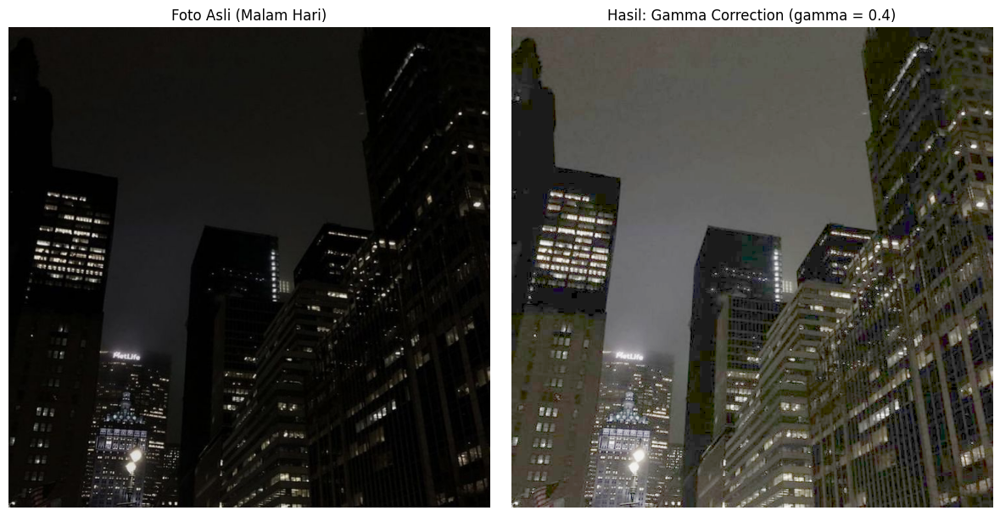

In [33]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca Foto Malam Hari (Gelap)
img = cv.imread('/content/drive/MyDrive/night.jpeg') # Sesuaikan path foto Anda

if img is None:
    # Gambar dummy jika gambar belum diunggah
    img = np.zeros((400, 600, 3), dtype=np.uint8)
    cv.putText(img, 'Foto Malam Hari', (150, 200), cv.FONT_HERSHEY_SIMPLEX, 1, (100, 100, 100), 2)

# 2. Perbaikan Fungsi Gamma Correction
def adjust_gamma(image, gamma=0.5):
    # PERBAIKAN: Eksponent langsung menggunakan nilai gamma (tanpa 1.0 / gamma)
    table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv.LUT(image, table)

# Eksekusi dengan gamma = 0.4 (Makin kecil nilainya, makin terang bagian gelapnya)
gamma_result = adjust_gamma(img, gamma=0.4)

# 3. Visualisasi Perbandingan
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Foto Asli (Malam Hari)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(gamma_result, cv.COLOR_BGR2RGB))
plt.title("Hasil: Gamma Correction (gamma = 0.4)")
plt.axis('off')

plt.tight_layout()
plt.show()

Berikut alasan dan risiko metode Gamma Correction ($\gamma < 1.0$):
* Alasan: Menerangkan area foto yang gelap secara signifikan tanpa membuat area terang (seperti lampu) menjadi terlalu silau (overexposed).
* Risiko: Memunculkan noise (bintik-bintik halus) pada area gelap dan membuat warna terlihat agak pudar (washed out) jika nilainya terlalu rendah.

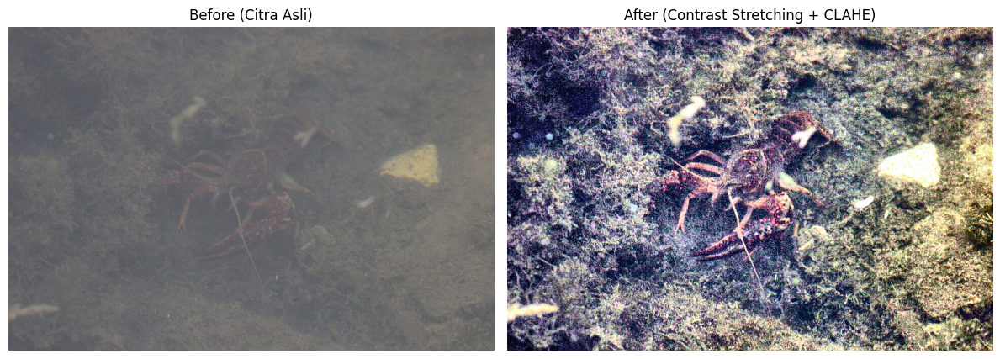

In [34]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# 1. Baca Citra Asli
img = cv.imread('/content/drive/MyDrive/crayfish.jpg') # Sesuaikan path file

if img is None:
    img = cv.imread('crayfish.jpg')

# 2. Kombinasi Metode: Contrast Stretching & CLAHE
# Step A: Contrast Stretching (Peregangan Kontras Linear)
p_min, p_max = np.percentile(img, (2, 98)) # Abaikan 2% outlier ekstrem
stretched = np.clip((img - p_min) * (255.0 / (p_max - p_min)), 0, 255).astype(np.uint8)

# Step B: CLAHE pada Kanal L (Ruang Warna LAB)
lab = cv.cvtColor(stretched, cv.COLOR_BGR2LAB)
l, a, b = cv.split(lab)

clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
cl = clahe.apply(l)

enhanced_lab = cv.merge((cl, a, b))
result = cv.cvtColor(enhanced_lab, cv.COLOR_LAB2BGR)

# 3. Visualisasi Before-After
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Before (Citra Asli)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title("After (Contrast Stretching + CLAHE)")
plt.axis('off')

plt.tight_layout()
plt.show()